# Skip

In [1]:
from copy import copy
import os
import subprocess
import string
from uuid import uuid4

from IPython.display import Audio, display, SVG
import tracery


def show(abc):
    base_filename = str(uuid4())
    abc_filename = base_filename + '.abc'
    midi_filename = base_filename + '.mid'
    svg_filename = 'Out001.svg'
    wav_filename = base_filename + '.wav'
    soundfont_path = './GeneralUser GS v1.471.sf2'
    
    with open(abc_filename, 'w') as f:
        f.write(abc)
    
    print(abc)
    
    subprocess.run(['abcm2ps', '-g', abc_filename])
    display(SVG(filename=svg_filename))
    
    subprocess.run(['abc2midi', abc_filename, '-o', midi_filename])
    subprocess.run(['fluidsynth', '-i', '-F', wav_filename, soundfont_path, midi_filename])
    display(Audio(filename=wav_filename))
                                
    os.remove(abc_filename)     
    os.remove(midi_filename)
    os.remove(svg_filename)
    os.remove(wav_filename)
    
def mark_nonterminals(text, rules):
    for symbol in rules:
        text = text.replace(symbol, '#'+symbol+'#')
    return text

def escape_square_brackets(rules):
    escaped = copy(rules)
    for symbol in escaped:
        rule = escaped[symbol]
        if isinstance(rule, list):
            escaped[symbol] = [item.replace('[', '\[').replace(']', '\]') for item in rule]
        else:
            escaped[symbol] = rule.replace('[', '\[').replace(']', '\]')
    return escaped

header = '''
X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
'''

def banjoify(melody, rules, header=header):
    grammar = tracery.Grammar(escape_square_brackets(rules))
    banjo = grammar.flatten(mark_nonterminals(melody, rules))
    show(header + banjo)

In [2]:
header = '''
X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
'''

# "Man of Constant Sorrow"


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d12 c2 _B2 G12
w: I am a man


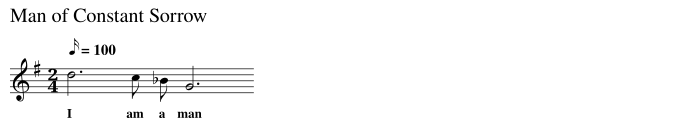

In [3]:
melody = 'd12 c2 _B2 G12'
lyrics = '\nw: I am a man'
show(header + melody + lyrics)

# Boom Chick

In [4]:
import itertools
pattern = itertools.cycle(['BOOM (2 beats)', 'CHICK (2 beats)'])

In [5]:
next(pattern)

'BOOM (2 beats)'

In [6]:
next(pattern)

'CHICK (2 beats)'

In [7]:
next(pattern)

'BOOM (2 beats)'

In [8]:
next(pattern)

'CHICK (2 beats)'

In [9]:
for _ in range(12//2):
    print(next(pattern))

BOOM (2 beats)
CHICK (2 beats)
BOOM (2 beats)
CHICK (2 beats)
BOOM (2 beats)
CHICK (2 beats)


In [10]:
def play(pattern, beats, beats_per_element=2):
    assert beats % beats_per_element == 0 
    sequence = [next(pattern) for _ in range(beats//beats_per_element)]
    return ' '.join(sequence)

play(pattern, 12)

'BOOM (2 beats) CHICK (2 beats) BOOM (2 beats) CHICK (2 beats) BOOM (2 beats) CHICK (2 beats)'

In [11]:
def boom_chick(melody, beats, string1='d', string5='g'):
    boom = f'{melody}2'
    chick = f'[{string1}{string5}]2'
    pattern = itertools.cycle([boom, chick])
    return play(pattern, beats)

In [12]:
boom_chick('d',12)

'd2 [dg]2 d2 [dg]2 d2 [dg]2'

# Boom Chick "Man of Constant Sorrow"


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d2 [dg]2 d2 [dg]2 d2 [dg]2 c2 _B2 G12


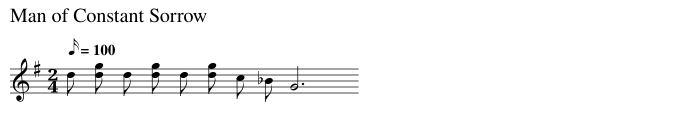

In [13]:
rules = {'d12': boom_chick('d',12)}
banjoify(melody, rules)

# More melody


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d12 c2 _B2 | G10 G2 _B2 G2 | c4 c8 _B2 c2 | d10 d2 c2 _B2 | G16


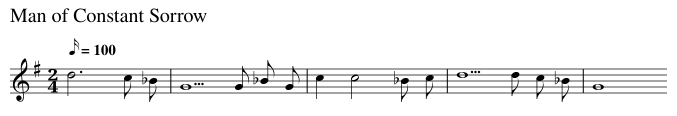

In [14]:
melody = 'd12 c2 _B2 | G10 G2 _B2 G2 | c4 c8 _B2 c2 | d10 d2 c2 _B2 | G16' 
banjoify(melody, rules={})

# Apply rule to all pitches


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d2 [dg]2 d2 [dg]2 d2 [dg]2 c2 _B2 | G2 [dg]2 G2 [dg]2 G2 G2 _B2 G2 | c2 [dg]2 c2 [dg]2 c2 [dg]2 _B2 c2 | d2 [dg]2 d2 [dg]2 d2 d2 c2 _B2 | G2 [dg]2 G2 [dg]2 G2 [dg]2 G2 [dg]2


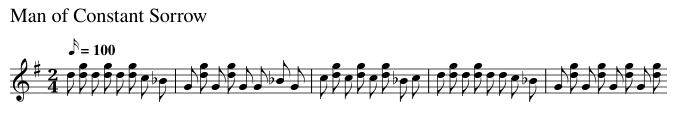

In [15]:
rules = {}
pitches = list(string.ascii_lowercase[:7]) + list(string.ascii_uppercase[:7])

for pitch in pitches:
    for beats in range(2, 18, 2):
        rules[f'{pitch}{beats}'] = boom_chick(pitch,beats)
        
banjoify(melody, rules)

# Another pattern: Bum Ditty

In [16]:
def bum_ditty(melody, beats, string1='d', string5='g'):
    bum = f'{melody}2'
    ditty = f'{string1}{string5}'
    pattern = itertools.cycle([bum, ditty])
    return play(pattern, beats)


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d2 dg d2 dg d2 dg c2 _B2 | G2 dg G2 dg G2 G2 _B2 G2 | c2 dg c2 dg c2 dg _B2 c2 | d2 dg d2 dg d2 d2 c2 _B2 | G2 dg G2 dg G2 dg G2 dg


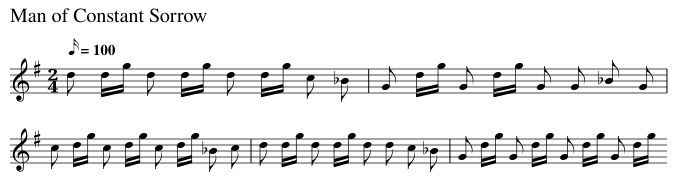

In [17]:
rules = {}
for pitch in pitches:
    for beats in range(4, 18, 2):
        rules[f'{pitch}{beats}'] = bum_ditty(pitch,beats)
        
banjoify(melody, rules)

# Combine


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d2 [dg]2 d2 dg d2 dg c2 _B2 | G2 dg G2 dg G2 G2 _B2 G2 | c2 dg c2 [dg]2 c2 dg _B2 c2 | d2 dg d2 [dg]2 d2 d2 c2 _B2 | G2 dg G2 [dg]2 G2 dg G2 dg


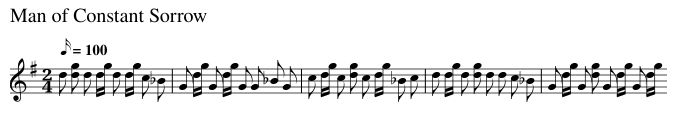

In [18]:
rules = {}
for pitch in pitches:
    rules[f'{pitch}16'] = ' '.join([f'#{pitch}4#'] *  4)
    rules[f'{pitch}14'] = ' '.join([f'#{pitch}4#'] *  3 + [f'{pitch}2'])
    rules[f'{pitch}12'] = ' '.join([f'#{pitch}4#'] *  3)
    rules[f'{pitch}10'] = ' '.join([f'#{pitch}4#'] *  2 + [f'{pitch}2'])
    rules[f'{pitch}8']  = ' '.join([f'#{pitch}4#'] *  2)
    rules[f'{pitch}6']  = ' '.join([f'#{pitch}4#'] *  1 + [f'{pitch}2'])
    rules[f'{pitch}4']  = [boom_chick(pitch,4), bum_ditty(pitch,4)]
    
banjoify(melody, rules)

#### Slightly different every time


X: 1
%%titleleft 1
T: Man of Constant Sorrow
M: 2/4
L: 1/16
Q: 100
K: G
%%MIDI program 105
d2 dg d2 dg d2 [dg]2 c2 _B2 | G2 dg G2 [dg]2 G2 G2 _B2 G2 | c2 dg c2 [dg]2 c2 dg _B2 c2 | d2 [dg]2 d2 [dg]2 d2 d2 c2 _B2 | G2 [dg]2 G2 [dg]2 G2 dg G2 dg


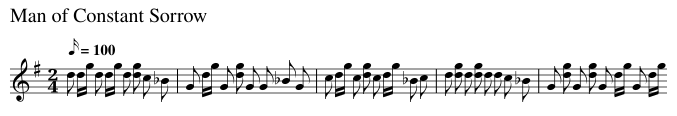

In [19]:
banjoify(melody, rules)